In [12]:
import tensorflow as tf
print(tf.__version__)

2.12.0


In [14]:
import tensorflow_datasets as tfds
# tensroflow_datasets 패키지가 없다면 설치하자.
tfds.__version__


'4.9.2'

# 데이터 로드

In [15]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    'cats_vs_dogs',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    with_info=True,
    as_supervised=True,
)

print(raw_train)
print(raw_validation)
print(raw_test)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /Users/stepground/tensorflow_datasets/cats_vs_dogs/4.0.0.incompleteGTC0VJ/cats_vs_dogs-train.tfrecor…

Dataset cats_vs_dogs downloaded and prepared to /Users/stepground/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


# 데이터 시각화 및 전처리

In [16]:
import matplotlib.pyplot as plt
%matplotlib inline 
# notebook을 실행한 브라우저에서 바로 그림을 보게 해준다.

%config InlineBackend.figure_format = 'retina' 
#그래프를 더 높은 해상도로 출력시켜준다.

print("완료")

완료


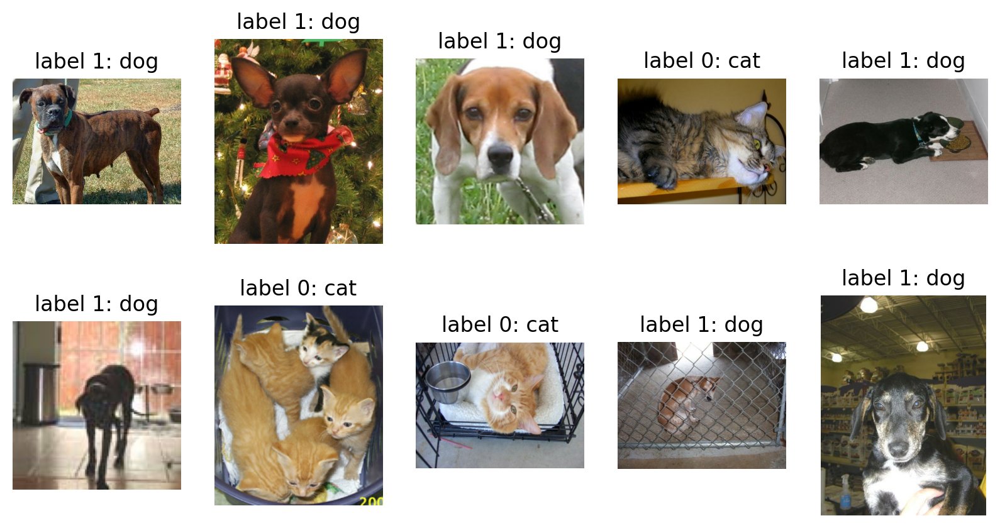

In [17]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [18]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정 # 기존 0~255 정수값을 -1~1사이 실수값으로 변경
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

print("완료")

완료


In [19]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)
# 모든 이미지 크기를 (160,160,3)으로 통일

print(train)
print(validation)
print(test)

<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_MapDataset element_spec=(TensorSpec(shape=(160, 160, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


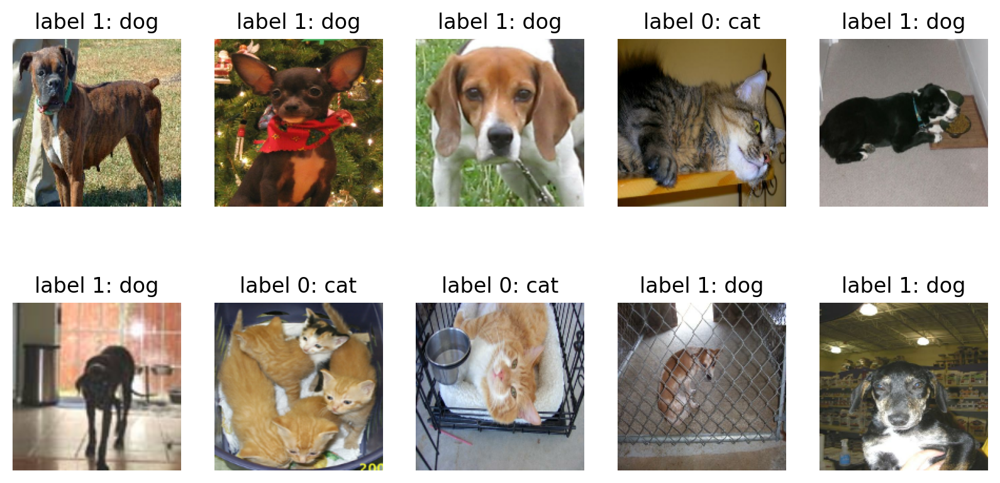

In [20]:
plt.figure(figsize=(10, 5))


get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):
    plt.subplot(2, 5, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

# 모델링

In [21]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [22]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=2, activation='softmax')
])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 160, 160, 16)      448       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 80, 80, 16)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 80, 80, 32)        4640      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 40, 40, 32)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 40, 40, 64)        18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 20, 20, 64)      

In [23]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

print("완료")

완료


In [24]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000
print("완료")

완료


In [25]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)
print("완료")

완료


In [26]:
for image_batch, label_batch in train_batches.take(1):
    pass


image_batch.shape, label_batch.shape 

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [52]:
label_batch

<tf.Tensor: shape=(32,), dtype=int64, numpy=
array([0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])>

In [27]:
EPOCHS = 5
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
582/582 [==============================] - 16s 24ms/step - loss: 0.6460 - accuracy: 0.6917 - val_loss: 0.8653 - val_accuracy: 0.6191
Epoch 2/5
582/582 [==============================] - 14s 23ms/step - loss: 0.5235 - accuracy: 0.7454 - val_loss: 0.5098 - val_accuracy: 0.7580
Epoch 3/5
582/582 [==============================] - 14s 24ms/step - loss: 0.5628 - accuracy: 0.7600 - val_loss: 0.5843 - val_accuracy: 0.7472
Epoch 4/5
582/582 [==============================] - 15s 25ms/step - loss: 0.6900 - accuracy: 0.7570 - val_loss: 0.6591 - val_accuracy: 0.7610
Epoch 5/5
582/582 [==============================] - 15s 25ms/step - loss: 0.9522 - accuracy: 0.7574 - val_loss: 1.0045 - val_accuracy: 0.7433


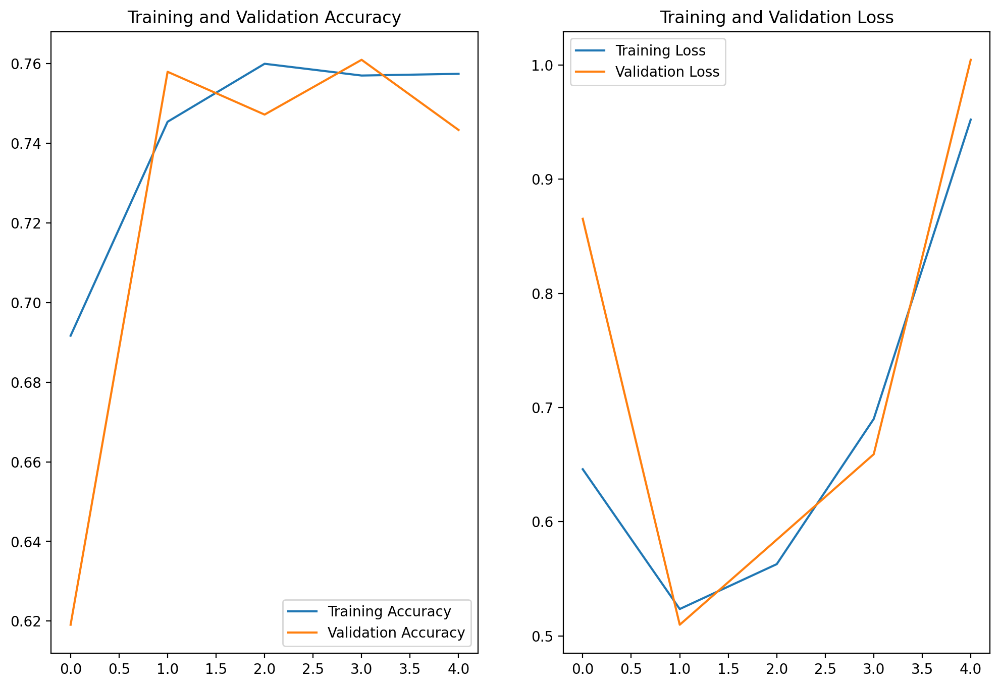

In [28]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [29]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 [==============================] - 0s 56ms/step


array([[9.9688798e-01, 3.1119753e-03],
       [9.9504095e-01, 4.9590981e-03],
       [4.5497334e-04, 9.9954504e-01],
       [9.9993086e-01, 6.9143789e-05],
       [1.8236805e-01, 8.1763196e-01],
       [3.2031384e-01, 6.7968619e-01],
       [6.0378176e-01, 3.9621827e-01],
       [3.4109432e-01, 6.5890568e-01],
       [6.5642409e-05, 9.9993432e-01],
       [9.7557440e-06, 9.9999022e-01],
       [3.4190107e-02, 9.6580982e-01],
       [1.9003550e-02, 9.8099649e-01],
       [9.7992891e-01, 2.0071084e-02],
       [3.4197902e-03, 9.9658018e-01],
       [9.9544936e-01, 4.5506191e-03],
       [9.6004212e-01, 3.9957903e-02],
       [7.2952652e-01, 2.7047345e-01],
       [4.7795456e-05, 9.9995220e-01],
       [1.8892004e-01, 8.1107992e-01],
       [4.3368999e-02, 9.5663095e-01],
       [8.3073837e-01, 1.6926168e-01],
       [1.7707147e-01, 8.2292855e-01],
       [9.9838030e-01, 1.6196896e-03],
       [8.6357850e-01, 1.3642155e-01],
       [9.0174139e-01, 9.8258629e-02],
       [6.5864295e-01, 3.

In [30]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

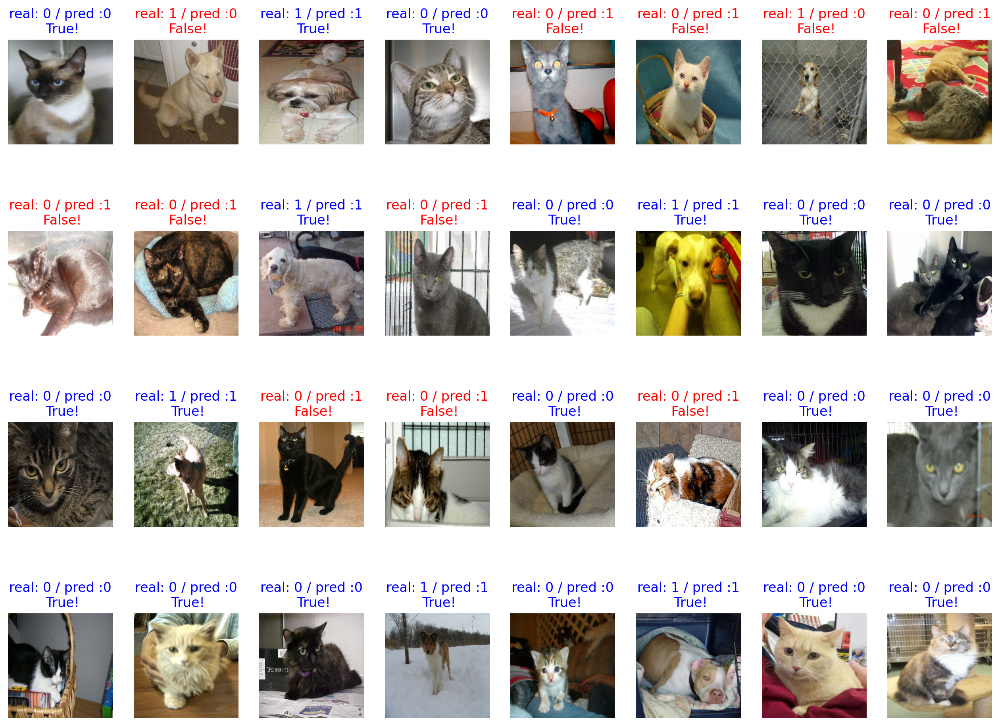

In [31]:
plt.figure(figsize=(16,12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

# VGG16 모델

In [33]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

58889256/58889256 [==============================] - 6s 0us/step


In [34]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [35]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [36]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 160, 160, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 160, 160, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 80, 80, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 80, 80, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 80, 80, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 40, 40, 128)       0     

In [37]:
feature_batch.shape #  (32, 5, 5, 512)

TensorShape([32, 5, 5, 512])

In [38]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [39]:
# 이 layer에 VGG16이 출력했던 feature_batch를 입력
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [40]:
# 여기에 Dense layer만 붙여주면 classifier가 완성된다!

dense_layer = tf.keras.layers.Dense(512, activation='relu')
prediction_layer = tf.keras.layers.Dense(2, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 2)


In [42]:
base_model.trainable = False

In [43]:
model = tf.keras.Sequential([
  base_model,
  global_average_layer, # flatten
  dense_layer,
  prediction_layer
])


model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 5, 5, 512)         14714688  
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense_3 (Dense)             (None, 512)               262656    
                                                                 
 dense_4 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


# 두 모델 비교 

In [44]:
base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [45]:
# 초기 손실과 정확도 검사

validation_steps=20
loss0, accuracy0 = model.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

20/20 [==============================] - 2s 61ms/step - loss: 0.6975 - accuracy: 0.5297
initial loss: 0.70
initial accuracy: 0.53


In [46]:
# 학습 시켜보자.

EPOCHS = 5   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.

history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/5
582/582 [==============================] - 41s 68ms/step - loss: 0.2262 - accuracy: 0.9027 - val_loss: 0.1959 - val_accuracy: 0.9256
Epoch 2/5
582/582 [==============================] - 40s 68ms/step - loss: 0.1626 - accuracy: 0.9321 - val_loss: 0.5849 - val_accuracy: 0.7928
Epoch 3/5
582/582 [==============================] - 40s 68ms/step - loss: 0.1549 - accuracy: 0.9362 - val_loss: 0.1433 - val_accuracy: 0.9398
Epoch 4/5
582/582 [==============================] - 40s 68ms/step - loss: 0.1499 - accuracy: 0.9370 - val_loss: 0.1567 - val_accuracy: 0.9355
Epoch 5/5
582/582 [==============================] - 40s 68ms/step - loss: 0.1456 - accuracy: 0.9392 - val_loss: 0.1619 - val_accuracy: 0.9334


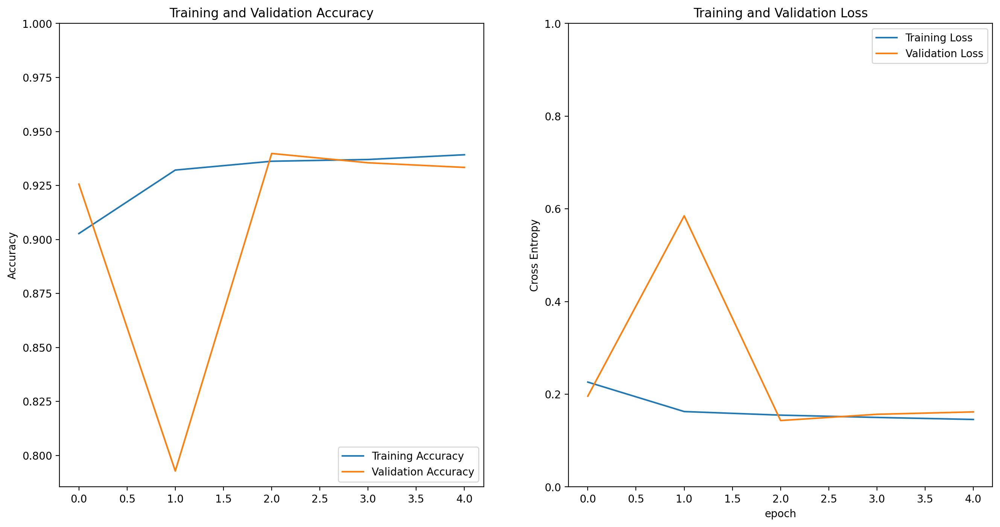

In [47]:
# 그래프로 학습과정을 보자

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [48]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

1/1 [==============================] - 0s 96ms/step


array([[9.99997616e-01, 2.33890955e-06],
       [1.28739038e-02, 9.87126052e-01],
       [1.05434194e-01, 8.94565761e-01],
       [9.99998927e-01, 1.01624721e-06],
       [9.93156970e-01, 6.84306398e-03],
       [9.61182952e-01, 3.88170220e-02],
       [1.69994710e-05, 9.99982953e-01],
       [3.82701010e-01, 6.17298961e-01],
       [9.41035926e-01, 5.89640848e-02],
       [9.34364319e-01, 6.56357110e-02],
       [2.57107354e-06, 9.99997377e-01],
       [9.99975681e-01, 2.43378563e-05],
       [9.71084774e-01, 2.89151892e-02],
       [9.27645445e-08, 9.99999881e-01],
       [9.97122705e-01, 2.87729688e-03],
       [9.84185636e-01, 1.58143081e-02],
       [9.97115731e-01, 2.88424268e-03],
       [4.70469333e-03, 9.95295346e-01],
       [3.94722372e-01, 6.05277598e-01],
       [9.88146305e-01, 1.18537461e-02],
       [8.27043355e-01, 1.72956660e-01],
       [9.66231465e-01, 3.37685533e-02],
       [9.93178248e-01, 6.82172785e-03],
       [9.68645334e-01, 3.13546658e-02],
       [9.980136

In [49]:
# prediction값을 라벨로 변환
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 1, 0, 0])

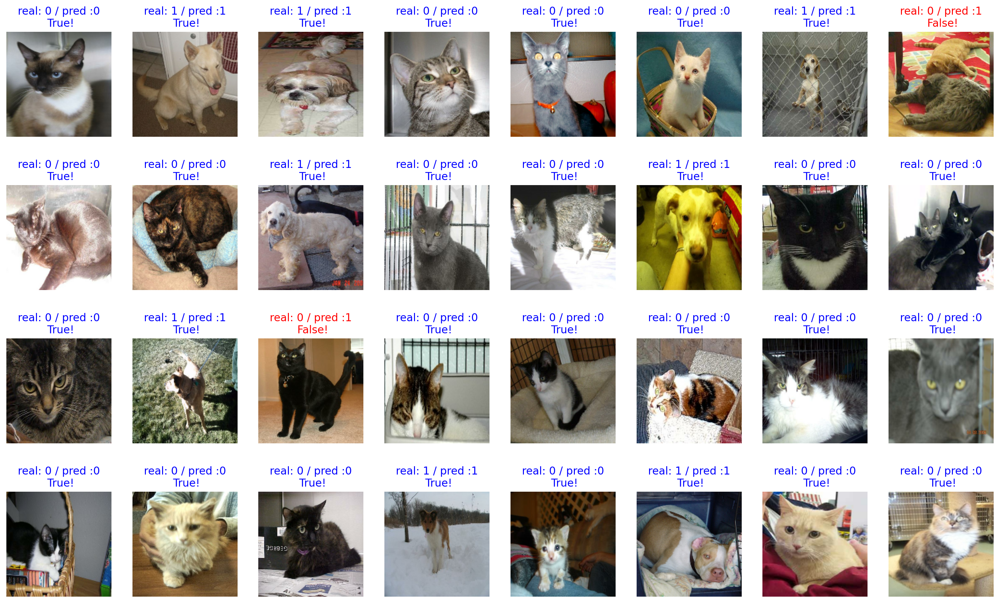

In [50]:
#확인
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [51]:
#정확도 측정
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

93.75
